In [1]:
!pip install pillow
import tensorflow as tf
import cupy as cp
import cudf as cd
import cuml as cl
import matplotlib.pyplot as plt
import os
import cv2
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True


In [3]:
BASE_DIR = '../input/cartoon-classification/cartoon_classification'
TRAIN_DIR = BASE_DIR+'/TRAIN/'
TEST_DIR = BASE_DIR+'/TEST/'
image_size = (256,256)

In [4]:
def display_image(path):
    im = Image.open(path)
#     width,height = im.size
    im.show()
    display(im)

In [5]:
def show_cartoon(number):
    for x in os.listdir(TRAIN_DIR):
        print(f"Image of cartoon {x}")
        path1 = TRAIN_DIR+x
        z = number
        for y in os.listdir(path1):
            if z<=0:
                break
            z-=1
            path2 = path1+'/'+y
            display_image(path2)

Image of cartoon adventure_time


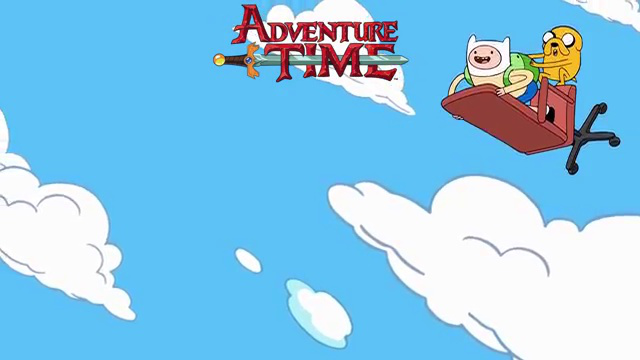

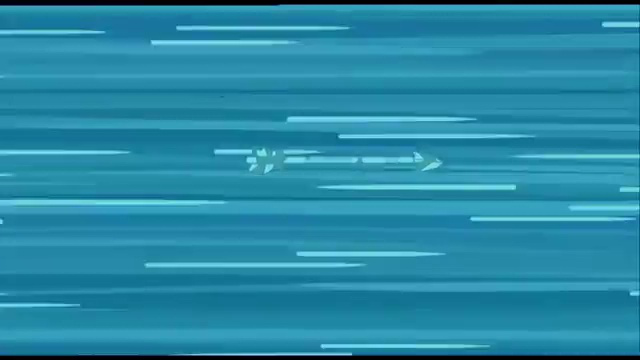

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.
display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.
display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


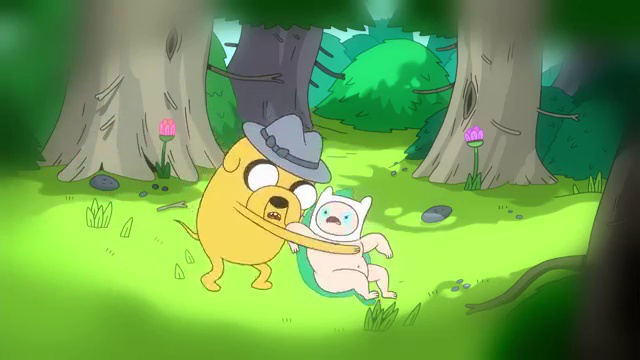

Image of cartoon Tsubasa


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


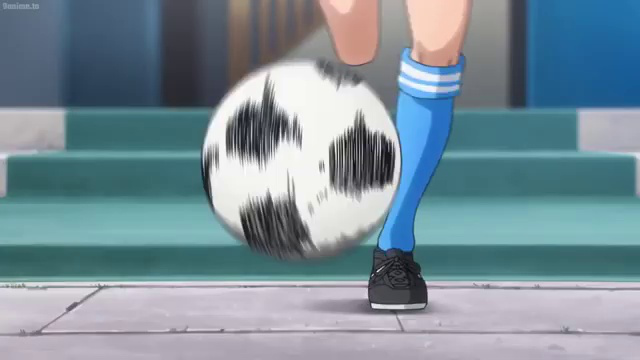

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


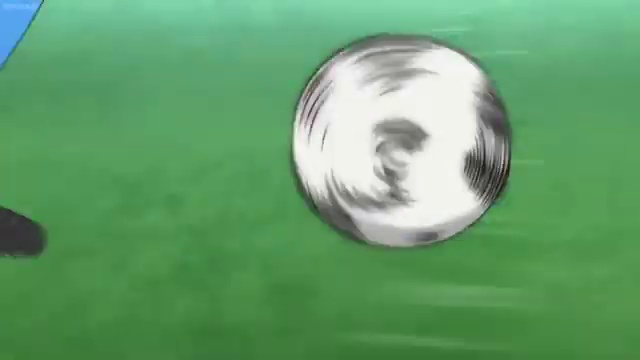

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


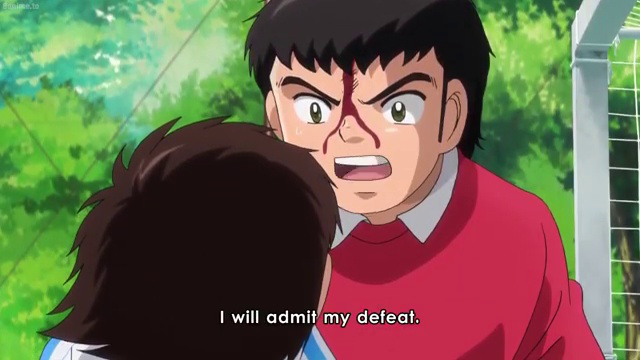

Image of cartoon southpark


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


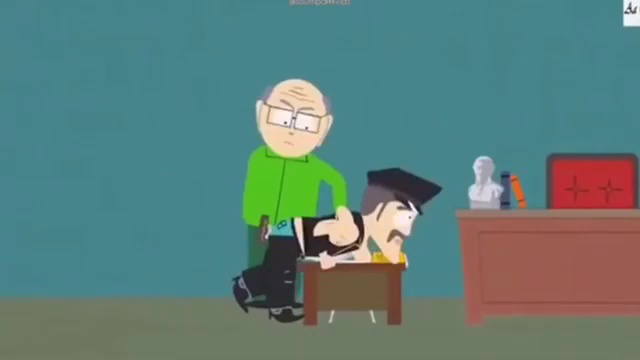

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


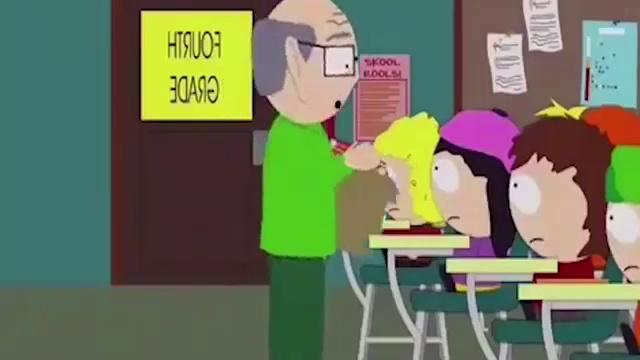

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


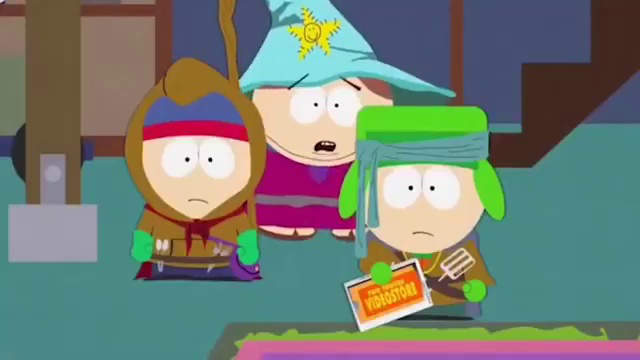

Image of cartoon spongebob


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


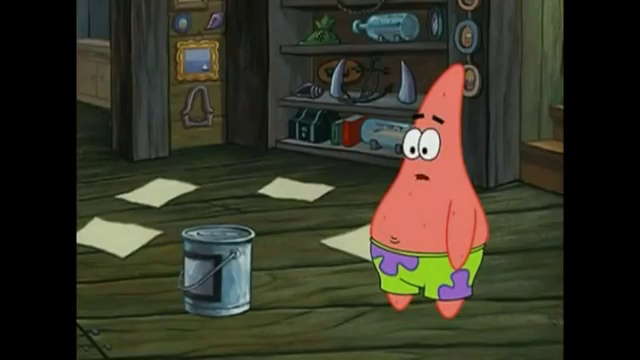

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


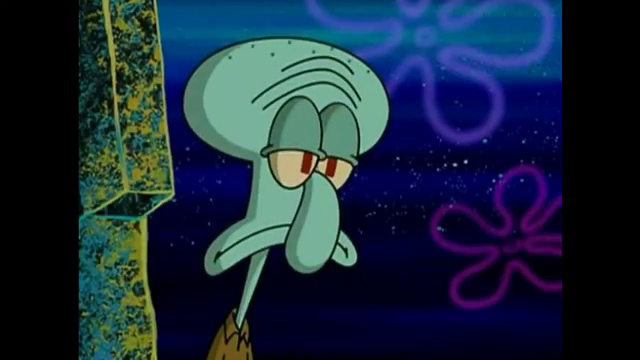

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


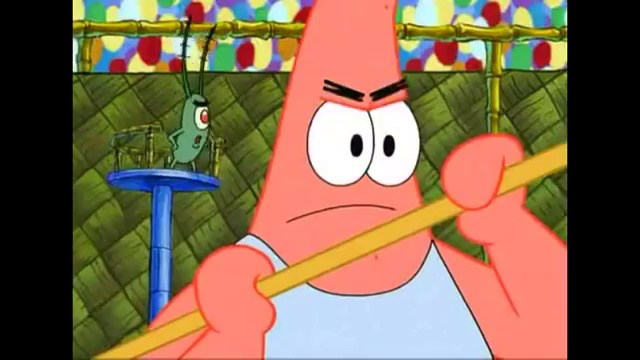

Image of cartoon Gumball


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


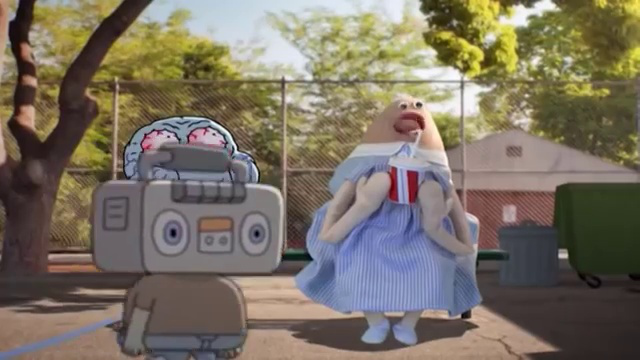

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


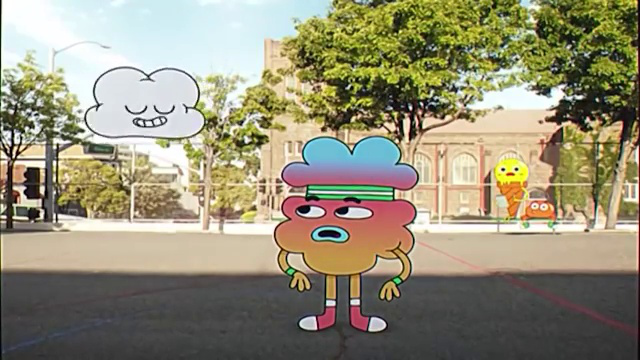

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


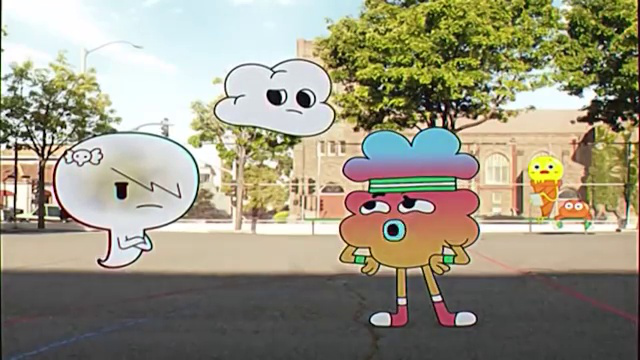

Image of cartoon smurfs


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


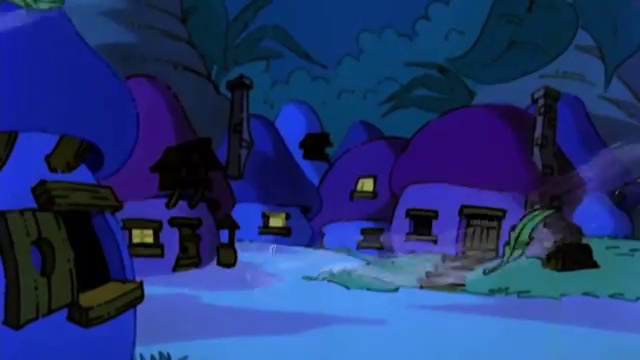

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


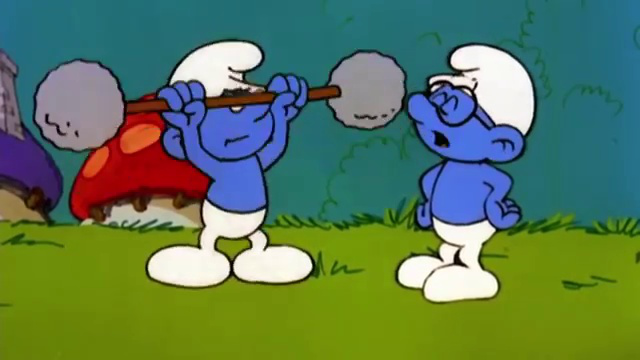

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


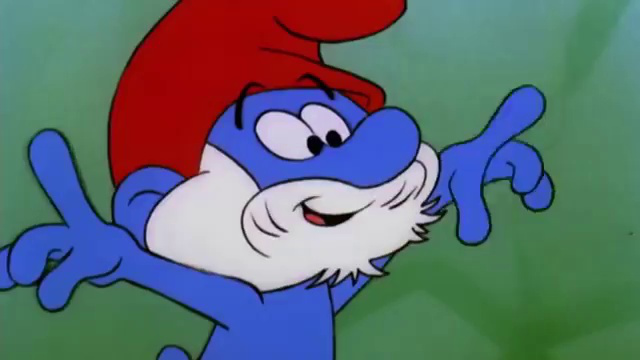

Image of cartoon tom_and_jerry


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


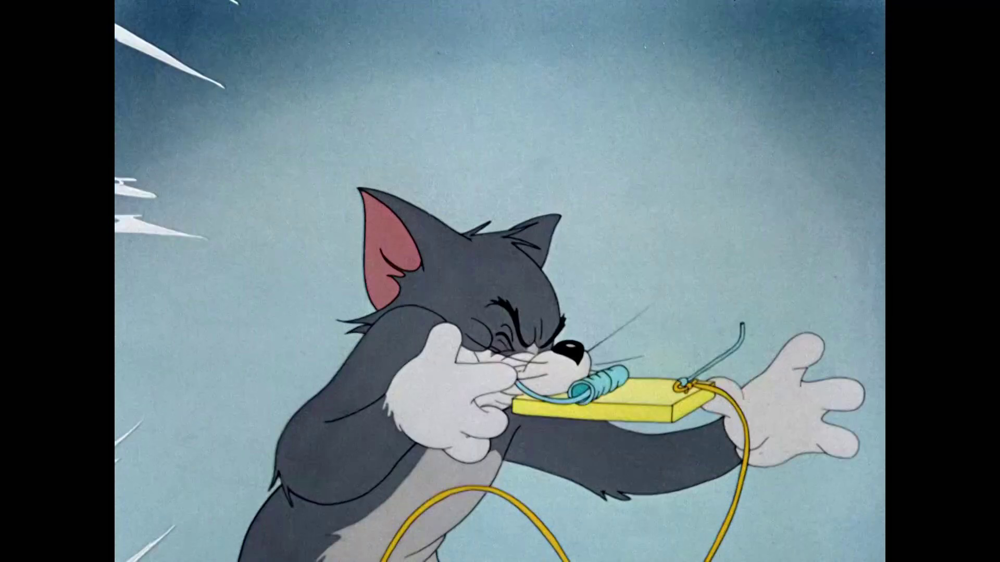

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


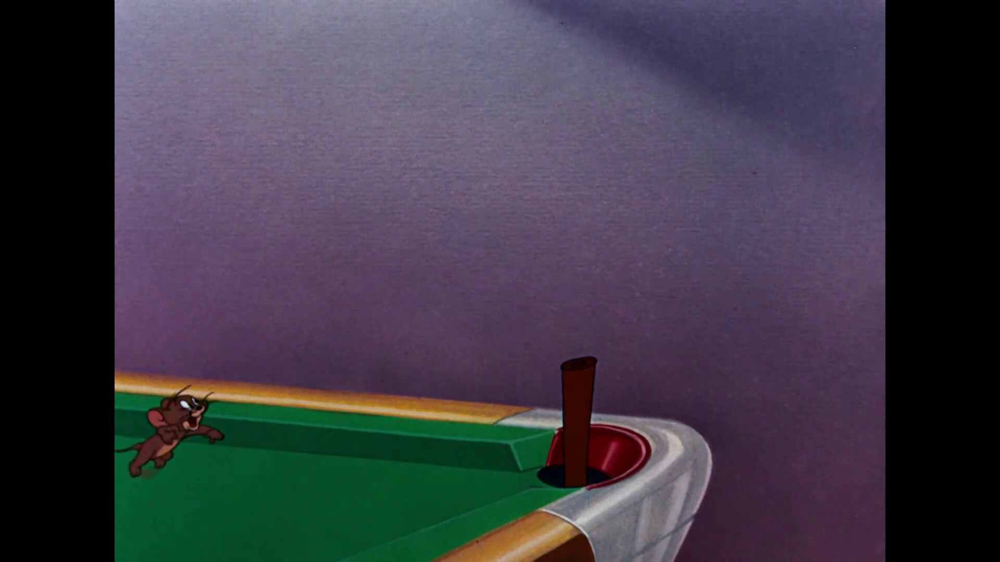

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


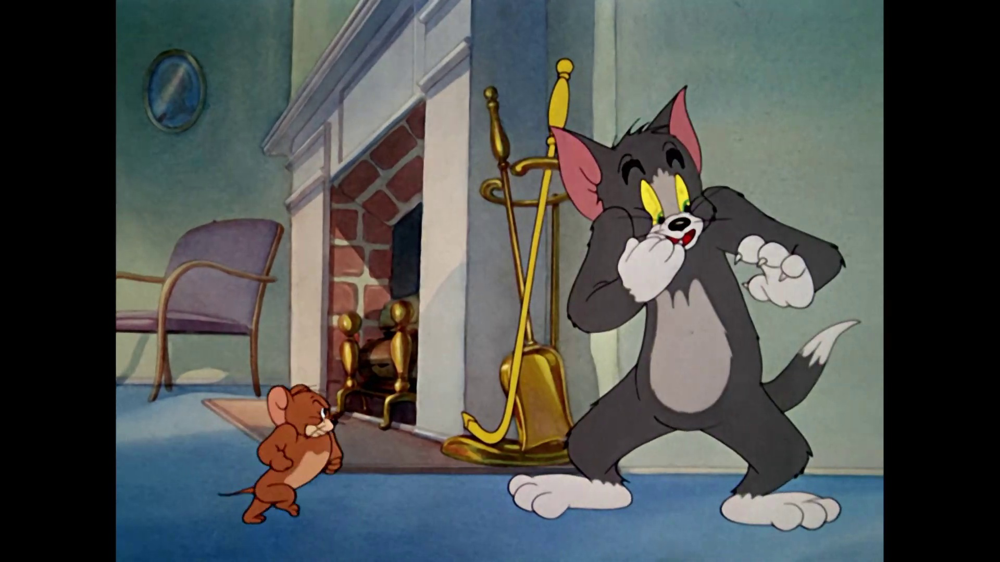

Image of cartoon catdog


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


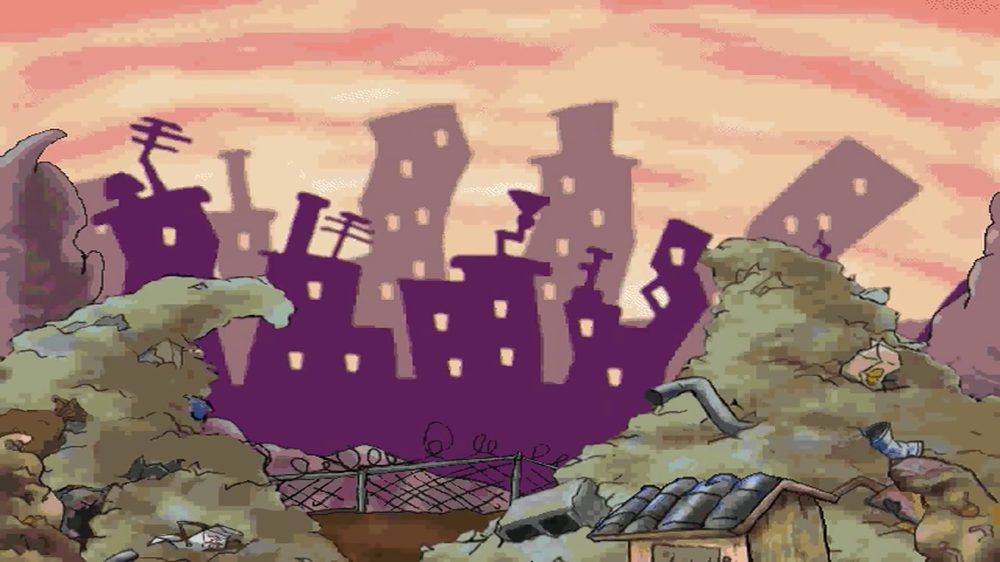

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


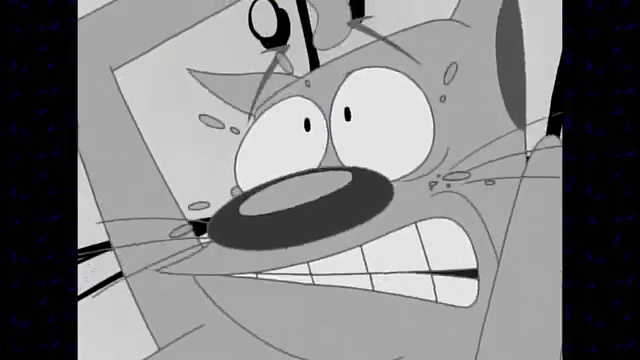

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


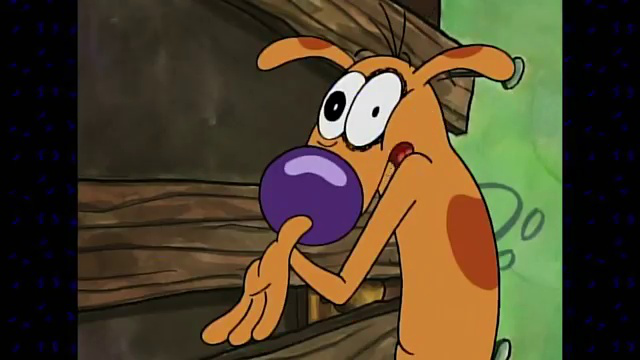

Image of cartoon pokemon


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


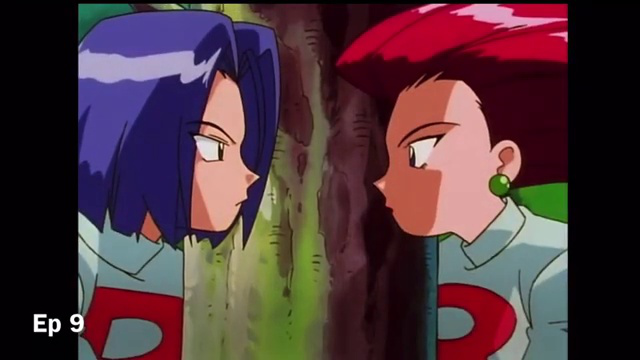

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


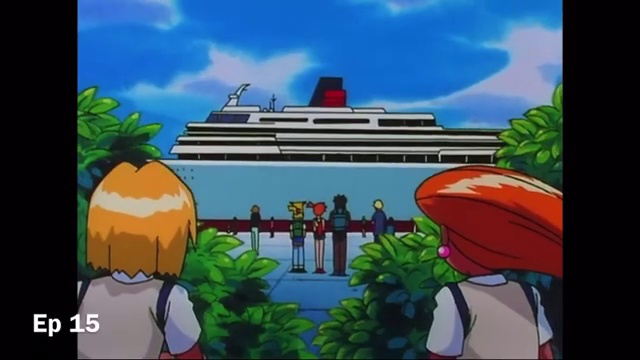

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


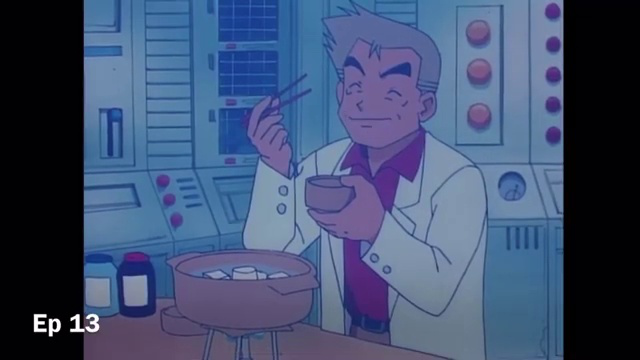

Image of cartoon Familyguy


display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


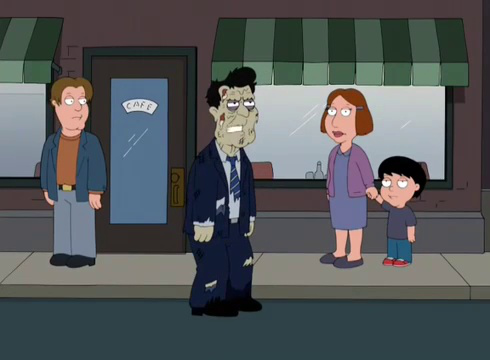

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


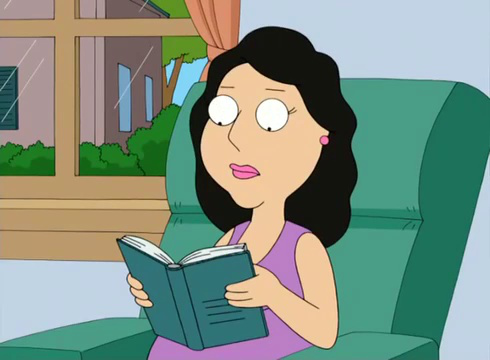

display: unable to open X server `' @ error/display.c/DisplayImageCommand/411.


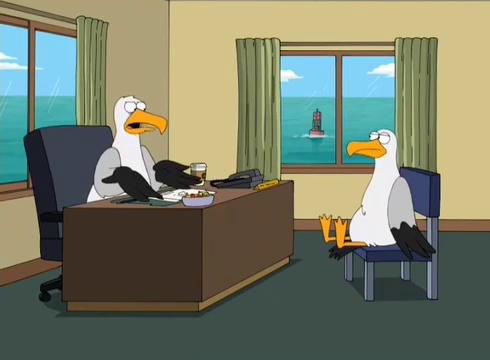

In [6]:
show_cartoon(3)

#VGG19

In [7]:
base_model = tf.keras.applications.vgg19.VGG19(
    include_top=False, weights='imagenet',input_shape = (256,256,3) 
)

2022-03-15 14:27:26.909378: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 14:27:26.914375: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 14:27:26.915062: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-15 14:27:26.916086: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

80150528/80134624 [==============================] - 1s 0us/step


In [8]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)       0     

In [9]:
base_model.trainable = False

In [10]:
inputs = tf.keras.Input(shape = (256,256,3))
x = base_model(inputs,training = False)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10,activation = 'softmax')(x)
model = tf.keras.Model(inputs, outputs)

In [11]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
vgg19 (Functional)           (None, 8, 8, 512)         20024384  
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 1024)              33555456  
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0     

In [12]:
epochs=5
ACCURACY_THRESHOLD = 0.98
batch_size = 32

In [13]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   horizontal_flip = True
                                  )
train_genator = train_datagen.flow_from_directory(TRAIN_DIR,batch_size = batch_size,target_size = (256,256))

Found 119617 images belonging to 10 classes.


In [14]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_genator = test_datagen.flow_from_directory(TEST_DIR,batch_size = batch_size,target_size = (256,256))

Found 18110 images belonging to 10 classes.


In [15]:
model.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.MeanAbsoluteError()]
             )

In [16]:
class myCallback(tf.keras.callbacks.Callback): 
    def on_epoch_end(self, epoch, logs={}): 
        if(logs.get('accuracy') > ACCURACY_THRESHOLD):   
            print("\nReached %2.2f%% accuracy, so stopping training!!" %(ACCURACY_THRESHOLD*100))   
            self.model.stop_training = True
callback = myCallback()

In [17]:
history = model.fit(train_genator,epochs = epochs,validation_data = test_genator,callbacks = [callback])

2022-03-15 14:29:15.938505: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/5


2022-03-15 14:29:18.127186: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


3739/3739 [==============================] - 1918s 510ms/step - loss: 0.1631 - accuracy: 0.9558 - precision: 0.9663 - recall: 0.9489 - mean_absolute_error: 0.0118 - val_loss: 0.8675 - val_accuracy: 0.8008 - val_precision: 0.8323 - val_recall: 0.7892 - val_mean_absolute_error: 0.0435
Epoch 2/5
3739/3739 [==============================] - 1638s 438ms/step - loss: 0.0700 - accuracy: 0.9805 - precision: 0.9837 - recall: 0.9781 - mean_absolute_error: 0.0050 - val_loss: 0.7513 - val_accuracy: 0.8351 - val_precision: 0.8790 - val_recall: 0.8130 - val_mean_absolute_error: 0.0368

Reached 98.00% accuracy, so stopping training!!


In [18]:
def plot(hist,metric):
    met = hist.history[metric]
    val_met = hist.history['val_'+metric]
    epochs = range(len(met))
    plt.plot(epochs, met, 'r', label='Training'+metric)
    plt.plot(epochs, val_met, 'b', label='Validation'+metric)
    plt.title('Training and validation '+metric)
    plt.legend()
    plt.show()

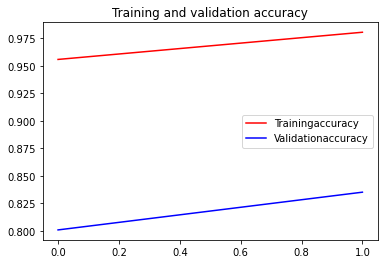

In [19]:
plot(history,'accuracy')

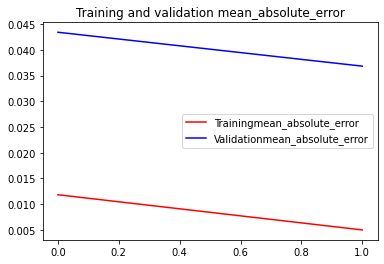

In [20]:
plot(history,'mean_absolute_error')

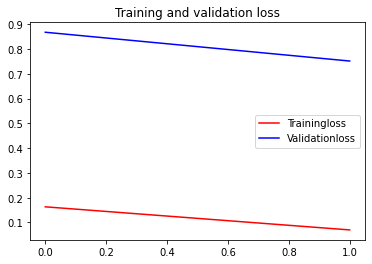

In [21]:
plot(history,'loss')

In [22]:
model.save('vgg_my_model.h5')

DENSENET

In [23]:
base_model2 = tf.keras.applications.densenet.DenseNet169(
    include_top=False, weights='imagenet', input_shape=(256,256,3))

51888128/51877672 [==============================] - 1s 0us/step


In [24]:
base_model2.summary()

Model: "densenet169"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 128, 128, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1/conv[0][0]                 
________________________________________________________________________________________

In [25]:
base_model2.trainable = False

In [26]:
inputs = tf.keras.Input(shape = (256,256,3))
x = base_model2(inputs,training = False)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10,activation = 'softmax')(x)
model2 = tf.keras.Model(inputs, outputs)

In [27]:
model2.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
densenet169 (Functional)     (None, 8, 8, 1664)        12642880  
_________________________________________________________________
flatten_1 (Flatten)          (None, 106496)            0         
_________________________________________________________________
dense_3 (Dense)              (None, 1024)              109052928 
_________________________________________________________________
dropout_2 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dropout_3 (Dropout)          (None, 1024)              0   

In [28]:
model2.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.MeanAbsoluteError()]
             )

In [29]:
history2 = model2.fit(train_genator,epochs = epochs,validation_data = test_genator,callbacks = [callback])

Epoch 1/5
3739/3739 [==============================] - 1783s 475ms/step - loss: 0.3710 - accuracy: 0.9608 - precision_1: 0.9640 - recall_1: 0.9589 - mean_absolute_error: 0.0086 - val_loss: 0.5237 - val_accuracy: 0.8980 - val_precision_1: 0.9169 - val_recall_1: 0.8948 - val_mean_absolute_error: 0.0206
Epoch 2/5
3739/3739 [==============================] - 1750s 468ms/step - loss: 0.1065 - accuracy: 0.9867 - precision_1: 0.9877 - recall_1: 0.9862 - mean_absolute_error: 0.0028 - val_loss: 0.4748 - val_accuracy: 0.9211 - val_precision_1: 0.9402 - val_recall_1: 0.9173 - val_mean_absolute_error: 0.0160

Reached 98.00% accuracy, so stopping training!!


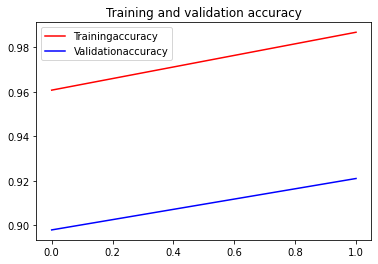

In [30]:
plot(history2,'accuracy')

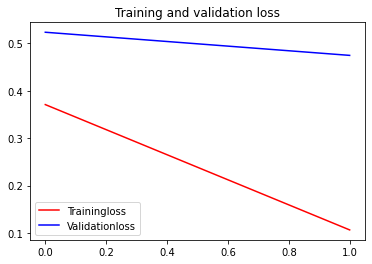

In [31]:
plot(history2,'loss')

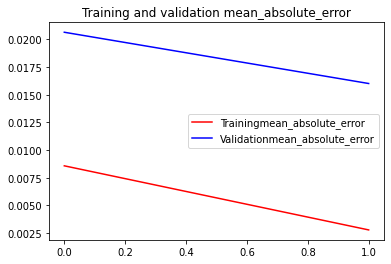

In [32]:
plot(history2,'mean_absolute_error')

In [33]:
model2.save('deepnet_my_model.h5')

inception_v3

In [34]:
base_model3 = tf.keras.applications.inception_v3.InceptionV3(
    include_top=False, weights='imagenet', input_shape=(256,256,3))

87924736/87910968 [==============================] - 1s 0us/step


In [35]:
base_model3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 127, 127, 32) 864         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 127, 127, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 127, 127, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [36]:
base_model3.trainable = False

In [37]:
inputs = tf.keras.Input(shape = (256,256,3))
x = base_model3(inputs,training = False)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(1024,activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(10,activation = 'softmax')(x)
model3 = tf.keras.Model(inputs, outputs)

In [38]:
model3.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 6, 6, 2048)        21802784  
_________________________________________________________________
flatten_2 (Flatten)          (None, 73728)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 1024)              75498496  
_________________________________________________________________
dropout_4 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_7 (Dense)              (None, 1024)              1049600   
_________________________________________________________________
dropout_5 (Dropout)          (None, 1024)              0   

In [39]:
model3.compile(optimizer = 'adam',
              loss = 'categorical_crossentropy',
              metrics=['accuracy',tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.MeanAbsoluteError()]
             )

In [40]:
history3 = model3.fit(train_genator,epochs = epochs,validation_data = test_genator,callbacks = [callback])

Epoch 1/5
3739/3739 [==============================] - 1776s 474ms/step - loss: 0.5519 - accuracy: 0.8940 - precision_2: 0.9357 - recall_2: 0.8711 - mean_absolute_error: 0.0259 - val_loss: 0.7983 - val_accuracy: 0.8049 - val_precision_2: 0.8632 - val_recall_2: 0.7591 - val_mean_absolute_error: 0.0482
Epoch 2/5
3739/3739 [==============================] - 1708s 457ms/step - loss: 0.1945 - accuracy: 0.9491 - precision_2: 0.9735 - recall_2: 0.9329 - mean_absolute_error: 0.0133 - val_loss: 0.9152 - val_accuracy: 0.7753 - val_precision_2: 0.8464 - val_recall_2: 0.7329 - val_mean_absolute_error: 0.0542
Epoch 3/5
3739/3739 [==============================] - 1654s 442ms/step - loss: 0.1746 - accuracy: 0.9552 - precision_2: 0.9726 - recall_2: 0.9424 - mean_absolute_error: 0.0119 - val_loss: 0.8360 - val_accuracy: 0.8007 - val_precision_2: 0.8794 - val_recall_2: 0.7467 - val_mean_absolute_error: 0.0544
Epoch 4/5
3739/3739 [==============================] - 1665s 445ms/step - loss: 0.1431 - accur

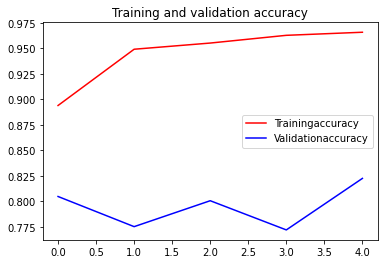

In [41]:
plot(history3,'accuracy')

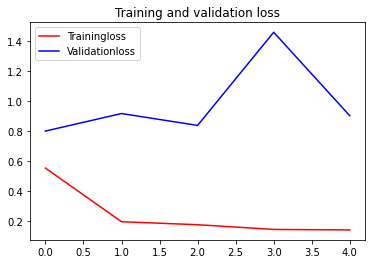

In [42]:
plot(history3,'loss')

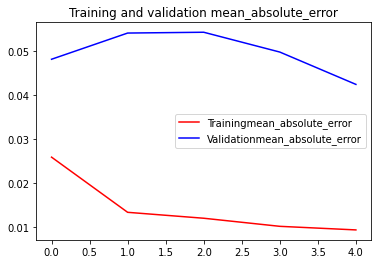

In [43]:
plot(history3,'mean_absolute_error')

In [44]:
model3.save('inceptionV3_my_model.h5')